# Môn: Phân tích xử lý ảnh
 * Sinh viên: Huỳnh Thị Bảo Trân
 * MSSV: 19110482
 * Bài thực hành: Lab03-Image Processing and Analysis

## Các thư viện đã được sử dụng

In [1]:
import numpy as np 
import pandas as pd
import cv2 
import os
from pylab import imread
from matplotlib import pyplot as plt 
from skimage.color import rgb2gray

## Định nghĩa các hàm

In [2]:
def ImShows(ImageData, LabelData, rows, cols, gridType = False):
    ImageArray = list(ImageData)
    LabelArray = list(LabelData)
    if(rows == 1 & cols == 1):
        fig = plt.figure(figsize = (20, 20))
    else:
        fig = plt.figure(figsize = (cols * 8, rows * 5))
    
    for i in range(1, cols * rows + 1):
        fig.add_subplot(rows, cols, i)
        image = ImageArray[i - 1]
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
            plt.grid(gridType)
        else:
            plt.imshow(image)
            plt.grid(gridType)
        plt.title(LabelArray[i - 1])
    
    plt.show()

In [3]:
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    ImShows(listImage, listCaption, row, col)

In [4]:
def SegmentColorImageByMask(image, Mask):    
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(image, image, mask = Mask)
    return result

In [5]:
def max_rgb_filter(image):
    (B, G, R) = cv2.split(image)
    M = np.maximum(np.maximum(R, G), B)
    R[R < M] = 0
    G[G < M] = 0
    B[B < M] = 0
    return cv2.merge([B, G, R])

In [6]:
def variance_of_laplacian(image):
    return cv2.Laplacian(image, cv2.CV_64F).var()

In [7]:
def get_subfiles(dir):
    return next(os.walk(dir))[2]

In [8]:
def gaussian_kernel(size, sigma = 1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size + 1, -size:size + 1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

# Bài làm

1. Tìm 1 ảnh trên internet và thực hiện các thao tác sau 
* Làm mờ ảnh với các kernel 3x3 và 5x5 
* Xuất giá trị đo mức độ mờ 
* Viết dòng thông tin về giá trị mức độ mờ trên ảnh 


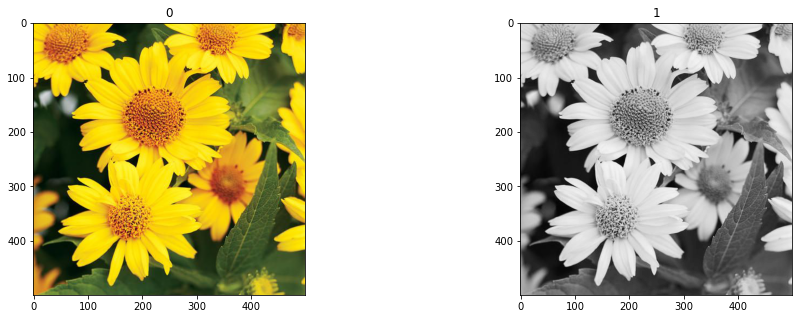

In [9]:
image_color = imread('flower01.jpg')
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

ShowListImages([image_color, image_gray], 1, 2)

In [10]:
kernel_3_3 = np.ones((3, 3), np.float32) / 9
kernel_5_5 = np.ones((5, 5), np.float32) / 25
print('Filtering Kernel 3x3:')
display(kernel_3_3)
print('Filtering Kernel 5x5:')
display(kernel_5_5)

Filtering Kernel 3x3:


array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

Filtering Kernel 5x5:


array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

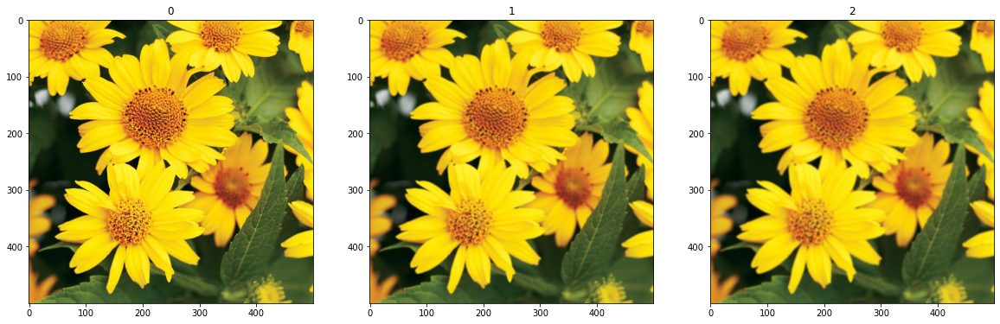

In [11]:
image_filter_3_3_01 = cv2.filter2D(image_color, -1, kernel_3_3)
image_filter_3_3_02 = cv2.filter2D(image_filter_3_3_01, -1, kernel_3_3)

ShowListImages([image_color, image_filter_3_3_01, image_filter_3_3_02], 1, 3)

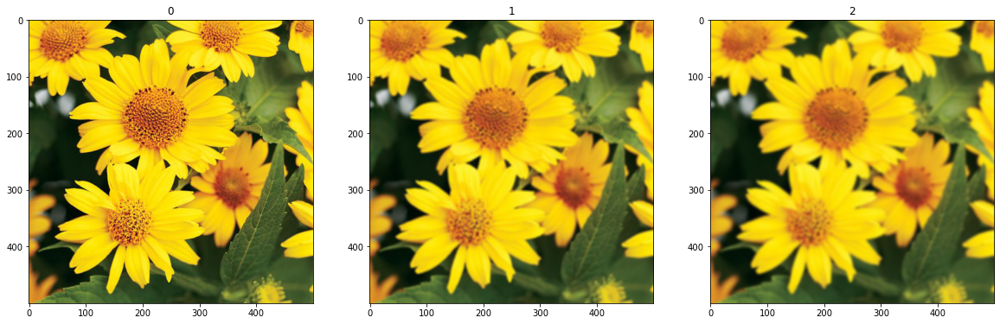

In [12]:
image_filter_5_5_01 = cv2.filter2D(image_color, -1, kernel_5_5)
image_filter_5_5_02 = cv2.filter2D(image_filter_5_5_01, -1, kernel_5_5)

ShowListImages([image_color, image_filter_5_5_01, image_filter_5_5_02], 1, 3)

In [13]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)
blur_mesurement_3_3_02 = variance_of_laplacian(image_filter_3_3_02)

print('Blur Measurement of image_color:', blur_mesurement)
print('Blur Measurement of image_filter_3_3_01:', blur_mesurement_3_3_01)
print('Blur Measurement of image_filter_3_3_02:', blur_mesurement_3_3_02)

Blur Measurement of image_color: 1025.938329267705
Blur Measurement of image_filter_3_3_01: 105.92980798271827
Blur Measurement of image_filter_3_3_02: 41.88642580895289


In [14]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_5_5_01 = variance_of_laplacian(image_filter_5_5_01)
blur_mesurement_5_5_02 = variance_of_laplacian(image_filter_5_5_02)

print('Blur Measurement of image_color:', blur_mesurement)
print('Blur Measurement of image_filter_5_5_01:', blur_mesurement_5_5_01)
print('Blur Measurement of image_filter_5_5_02:', blur_mesurement_5_5_02)

Blur Measurement of image_color: 1025.938329267705
Blur Measurement of image_filter_5_5_01: 27.560238969939558
Blur Measurement of image_filter_5_5_02: 8.985938296104885


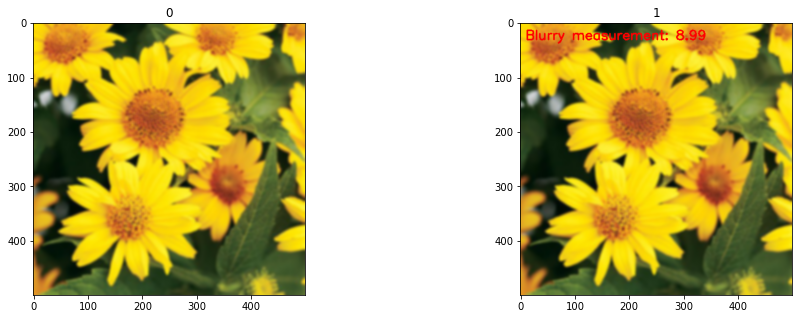

In [15]:
text = 'Blurry measurement'
fm = blur_mesurement_5_5_02
image_filter_5_5_02_text = image_filter_5_5_02.copy()
cv2.putText(image_filter_5_5_02_text, '{}: {:.2f}'.format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

ShowListImages([image_filter_5_5_02, image_filter_5_5_02_text], 1, 2)

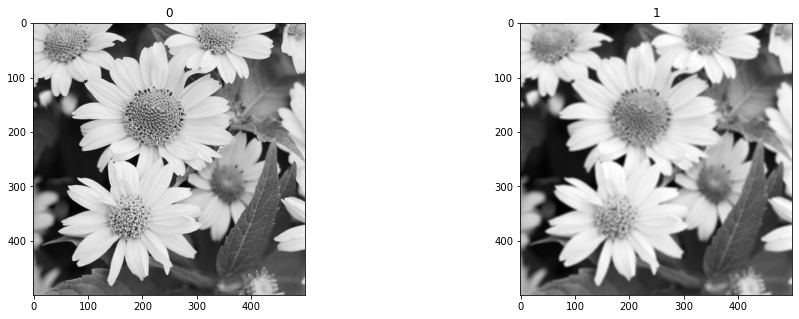

Blur Measurement of image_gray: 986.3840150716
Blur Measurement of image_gray_filter: 28.057905401456004


In [16]:
image_gray_filter = cv2.filter2D(image_gray, -1, kernel_5_5)

ShowListImages([image_gray, image_gray_filter], 1, 2)
print('Blur Measurement of image_gray:', variance_of_laplacian(image_gray))
print('Blur Measurement of image_gray_filter:', variance_of_laplacian(image_gray_filter))

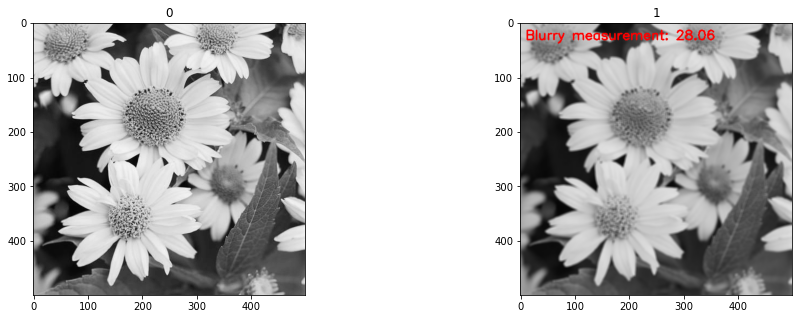

In [17]:
image_gray_filter_color = cv2.cvtColor(image_gray_filter, cv2.COLOR_GRAY2RGB)
text = 'Blurry measurement'
fm = variance_of_laplacian(image_gray_filter)
cv2.putText(image_gray_filter_color, '{}: {:.2f}'.format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

ShowListImages([image_gray, image_gray_filter_color], 1, 2)

2. Tìm 1 ảnh trên internet và thực hiện các thao tác sau 
* Làm rõ ảnh với các kernel 3x3 và 5x5 
* Xuất giá trị đo mức độ rõ 
* Viết dòng thông tin về giá trị mức độ rõ trên ảnh 

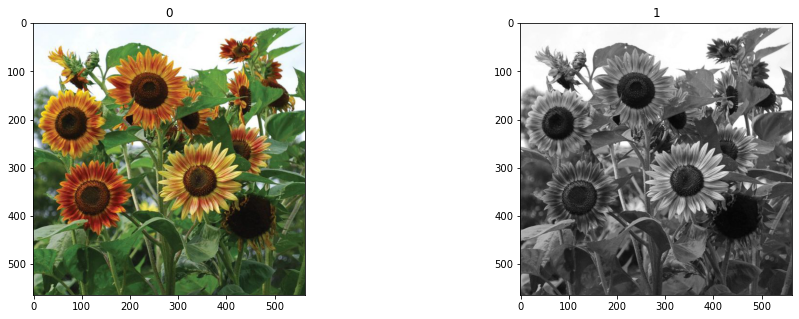

In [18]:
image_color = imread('flower02.jpg')
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

ShowListImages([image_color, image_gray], 1, 2)

In [19]:
kernel_sharpen_01 = np.array([[-1,-1,-1], 
                              [-1, 9,-1], 
                              [-1,-1,-1]])

kernel_sharpen_02 = np.array(([0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]), dtype = 'int')

print('Filtering kernel_sharpen_01:')
display(kernel_sharpen_01)
print('Filtering kernel_sharpen_02:')
display(kernel_sharpen_02)

Filtering kernel_sharpen_01:


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Filtering kernel_sharpen_02:


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

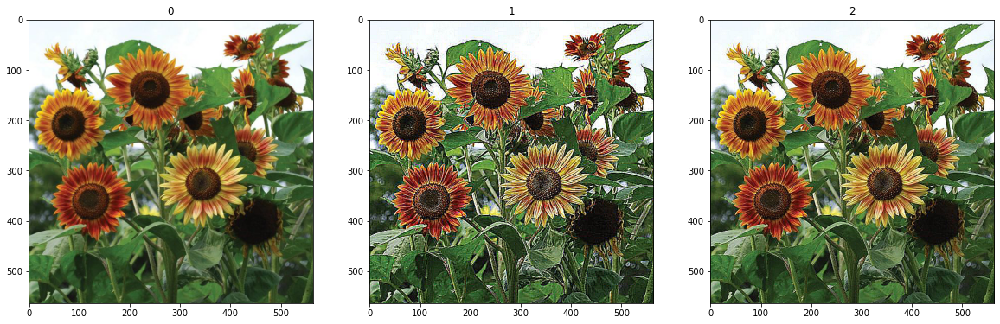

In [20]:
image_color_sharpen_01 = cv2.filter2D(image_color, -1, kernel_sharpen_01)
image_color_sharpen_02 = cv2.filter2D(image_color, -1, kernel_sharpen_02)

ShowListImages([image_color, image_color_sharpen_01, image_color_sharpen_02], 1, 3)

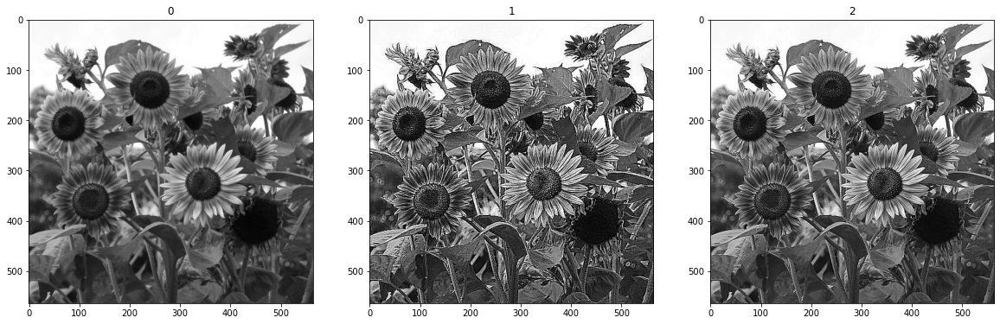

In [21]:
image_gray_sharpen_01 = cv2.filter2D(image_gray, -1, kernel_sharpen_01)
image_gray_sharpen_02 = cv2.filter2D(image_gray, -1, kernel_sharpen_02)

ShowListImages([image_gray, image_gray_sharpen_01, image_gray_sharpen_02], 1, 3)

In [22]:
print('Sharpen Measurement of image_color:', variance_of_laplacian(image_color))
print('Sharpen Measurement of image_color_sharpen_01:', variance_of_laplacian(image_color_sharpen_01))
print('Sharpen Measurement of image_color_sharpen_02:', variance_of_laplacian(image_color_sharpen_02))

Sharpen Measurement of image_color: 815.8221293641536
Sharpen Measurement of image_color_sharpen_01: 28818.438851119965
Sharpen Measurement of image_color_sharpen_02: 12832.218007802423


In [23]:
print('Sharpen Measurement of image_gray:', variance_of_laplacian(image_gray))
print('Sharpen Measurement of image_gray_sharpen_01:', variance_of_laplacian(image_gray_sharpen_01))
print('Sharpen Measurement of image_gray_sharpen_02:', variance_of_laplacian(image_gray_sharpen_02))

Sharpen Measurement of image_gray: 777.624316944246
Sharpen Measurement of image_gray_sharpen_01: 29206.579489027354
Sharpen Measurement of image_gray_sharpen_02: 13170.132409617432


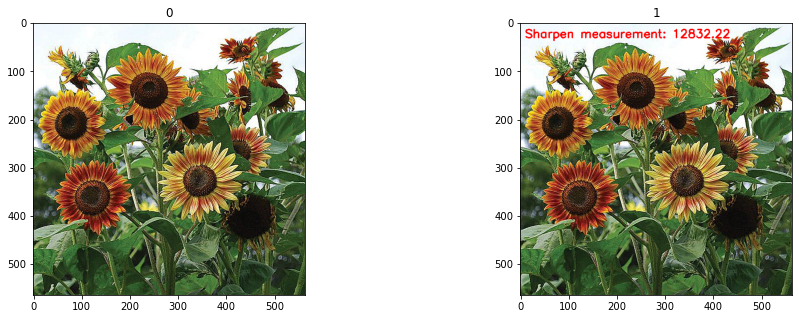

In [24]:
text = 'Sharpen measurement'
fm = variance_of_laplacian(image_color_sharpen_02)
image_filter_5_5_02_text = image_color_sharpen_02.copy()
cv2.putText(image_filter_5_5_02_text, '{}: {:.2f}'.format(text, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowListImages([image_color_sharpen_02, image_filter_5_5_02_text], 1, 2)

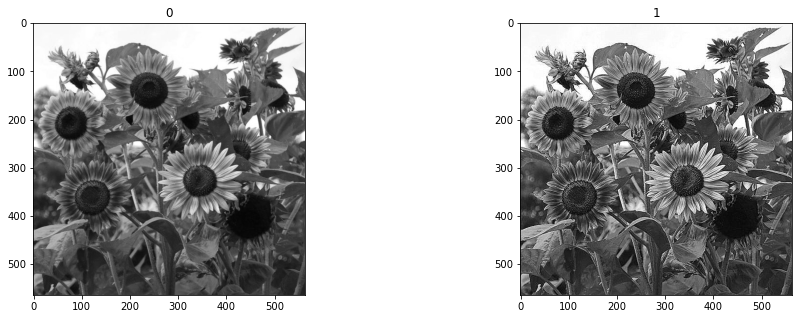

Sharpen Measurement of image_gray: 777.624316944246
Sharpen Measurement of image_gray_filter: 13170.132409617432


In [25]:
image_gray_filter = cv2.filter2D(image_gray, -1, kernel_sharpen_02)

ShowListImages([image_gray, image_gray_filter], 1, 2)
print('Sharpen Measurement of image_gray:', variance_of_laplacian(image_gray))
print('Sharpen Measurement of image_gray_filter:', variance_of_laplacian(image_gray_filter))

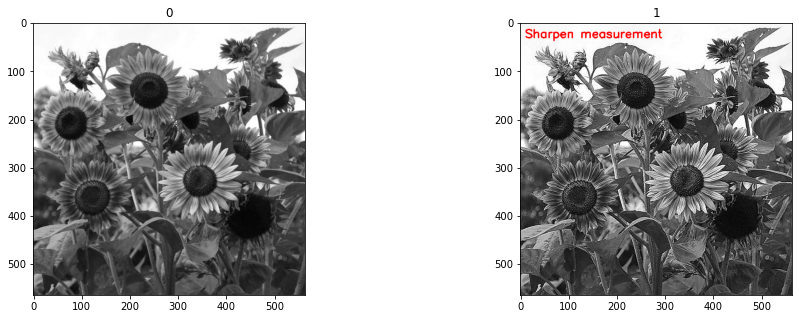

In [26]:
image_gray_filter_color = cv2.cvtColor(image_gray_sharpen_02, cv2.COLOR_GRAY2RGB)
text = 'Sharpen measurement'
fm = variance_of_laplacian(image_gray_sharpen_02)
cv2.putText(image_gray_filter_color, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

ShowListImages([image_gray, image_gray_filter_color], 1, 2)

3. Tạo một thư mục ảnh gồm 5 ảnh (kiếm từ Internet)
* Viết hàm đọc toàn bộ ảnh trong thư mục “Image_Input” đó vào một List ảnh (Gợi ý : tìm internet cách đọc thư mục) 
* Định nghĩa ngưỡng mờ dựa trên giá độ đo mờ
* Đọc lần lượt các ảnh : nếu ảnh nào ngoài ngưỡng mờ ta ghi một dòng thông tin trên ảnh là “Blur Image :” kèm giá trị mờ. Nếu ảnh nào tốt thì ta ghi “Good Image” trên ảnh. 
* Tất cả các ảnh sau khi đánh giá được lưu vào một thư mục “Image_BlurDetection_Output”

In [27]:
pathData = 'Image_Input'
print(os.path.isdir(pathData))

True


In [28]:
allNames = get_subfiles(pathData)
def read_file_name(pathData):
    img = []
    for idx in range(len(allNames)):
        temp = cv2.imread(pathData + allNames[idx])
        img.append(temp)

    ImageDB = img.copy()
    NameDB = allNames
    return NameDB

In [29]:
NameDB = read_file_name(pathData)
NameDB

['cat.jpg', 'love_animal.jpg', 'marathon.jpg', 'motocycle.jpg', 'product.jpg']

In [30]:
def blur_detection(idx):
    image_color = imread(pathData + '/' + NameDB[idx])
    
    image_filter_5_5_01 = cv2.filter2D(image_color, -1, kernel_5_5)
    image_filter_5_5_02 = cv2.filter2D(image_filter_5_5_01, -1, kernel_5_5)
    text0 = 'Blur Image'
    text1 = 'Good Image'
    fm = variance_of_laplacian(image_filter_5_5_02)
    image_filter_5_5_02_text = image_filter_5_5_02.copy()
    if fm > 5:
        cv2.putText(image_filter_5_5_02_text, '{}: {:.2f}'.format(text0, fm), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
    else:
        cv2.putText(image_filter_5_5_02_text, text1, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 5)
    ShowListImages([image_color, image_filter_5_5_02, image_filter_5_5_02_text], 1, 3)

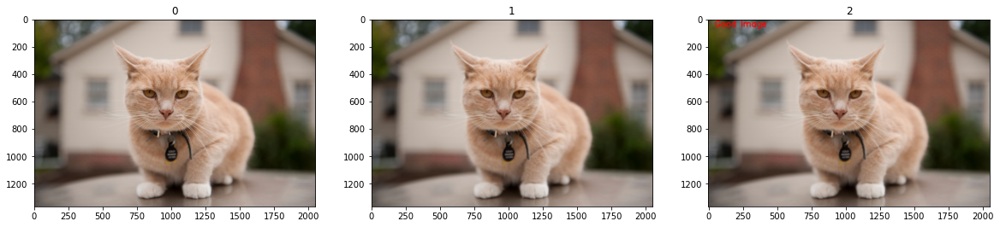

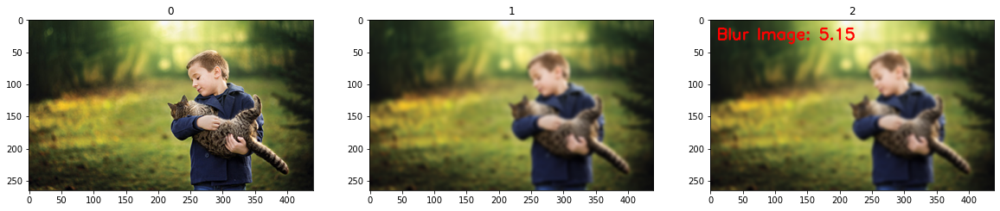

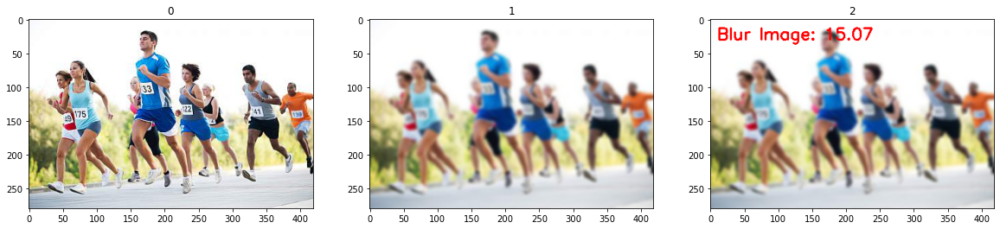

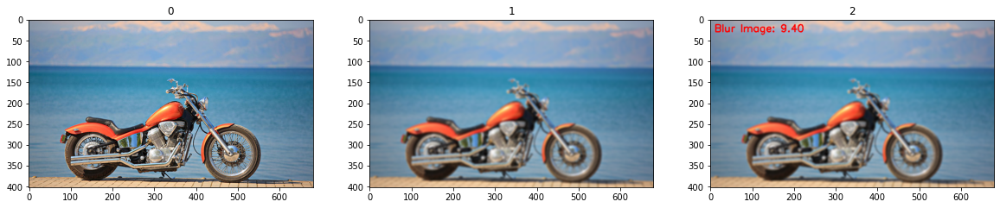

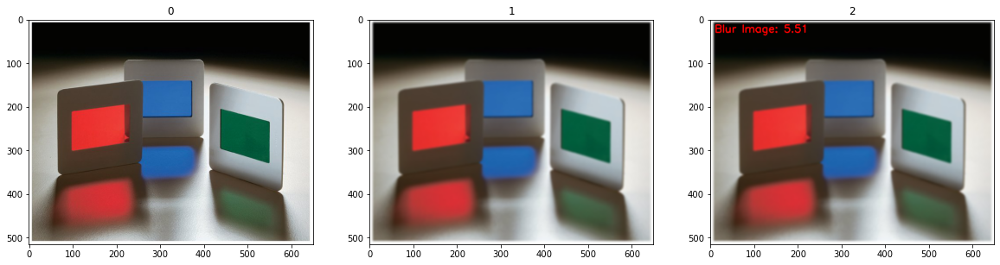

In [31]:
for idx in range(len(NameDB)):
    blur_detection(idx)

In [32]:
def save_file(pathData, filename, idx, mode = 'w'):
    os.makedirs(pathData, exist_ok = True)
    with open(os.path.join(pathData, filename), mode) as f:
        file_content = blur_detection(idx)

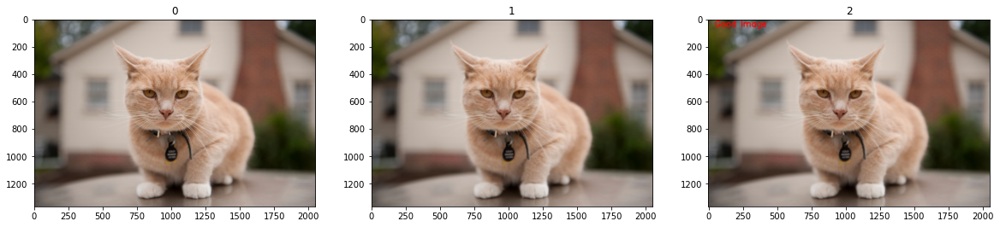

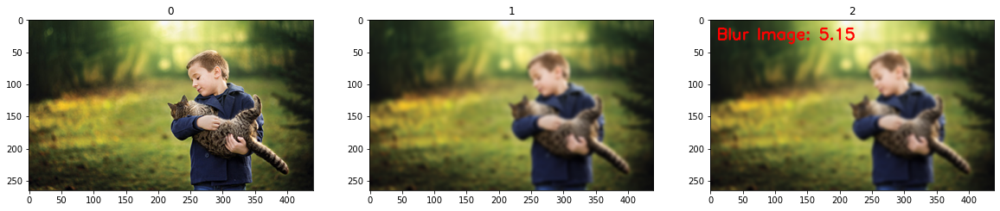

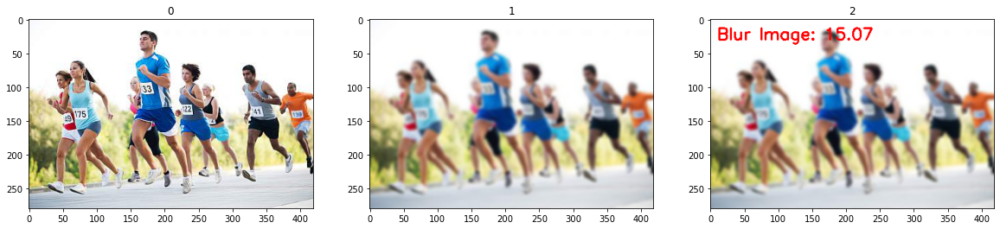

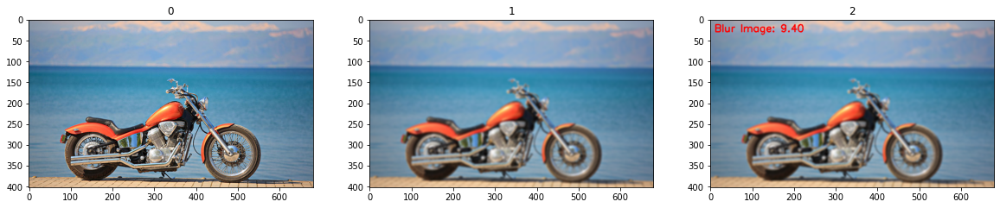

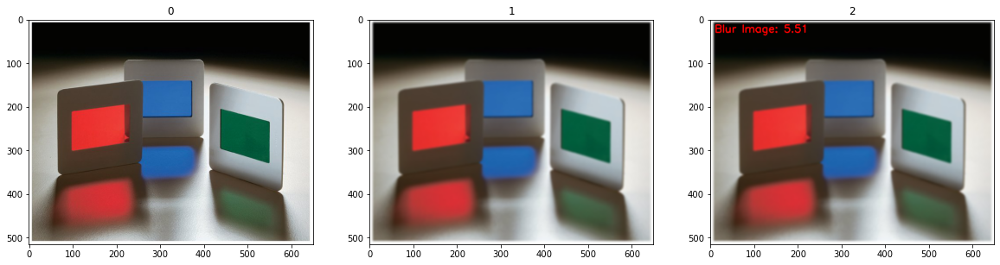

In [33]:
for idx in range(len(NameDB)):
    save_file('Image_BlurDetection_Output', 'new' + '_' + NameDB[idx], idx)

4. Tìm 1 ảnh trên Internet và thực hiện các bước sau :
* Xuất ảnh từng điểm ảnh hiển thị giá trị RGBMax 
* Xuất các vị trí có giá trị R đạt max, G đạt max và B đạt max
* Thưc hiện làm mờ ảnh rồi sau đó làm rõ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không 
* Thưc hiện làm rõ ảnh rồi sau đó làm mờ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không
* Tìm cạnh và tạo ra các ảnh về cạnh sau : ảnh cạnh ngang, cạnh dọc và ảnh cạnh tổng 

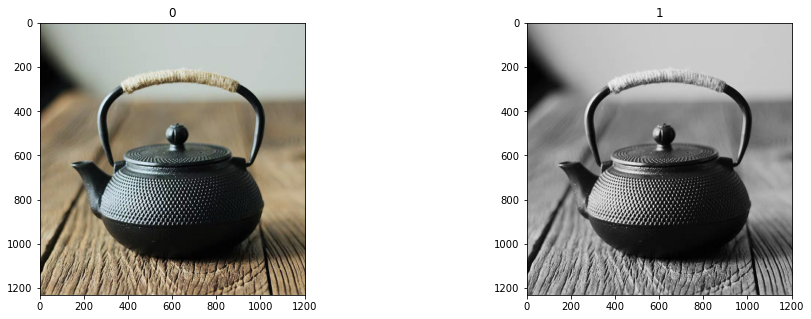

In [34]:
image_color = imread('tea.jpg')
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

ShowListImages([image_color, image_gray], 1, 2)

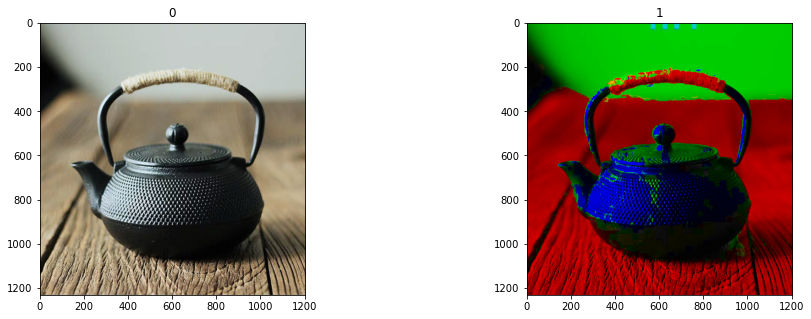

In [35]:
image_color_rgbmax = max_rgb_filter(image_color)

ShowListImages([image_color, image_color_rgbmax], 1, 2)

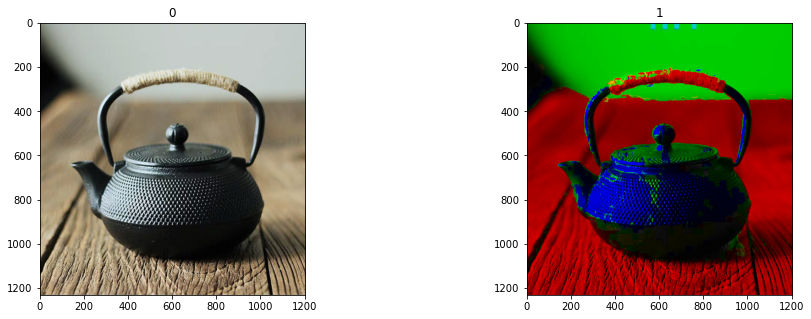

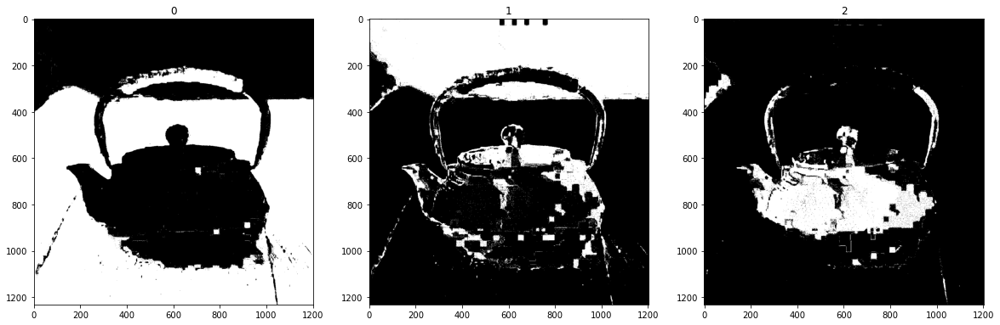

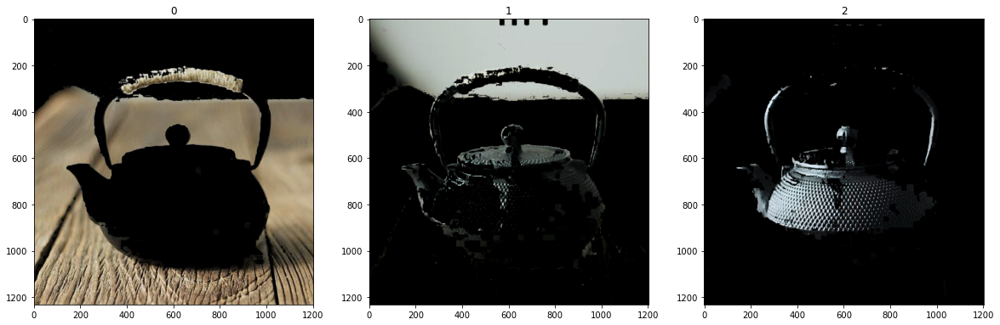

In [36]:
image_maxR_mask = image_gray < 0
image_maxG_mask = image_gray < 0
image_maxB_mask = image_gray < 0

R = image_color_rgbmax[:, :, 0]
G = image_color_rgbmax[:, :, 1]
B = image_color_rgbmax[:, :, 2]

image_maxR_mask[(G == 0) & (B == 0)] = 1
image_maxG_mask[(R == 0) & (B == 0)] = 1
image_maxB_mask[(G == 0) & (R == 0)] = 1

image_maxR = SegmentColorImageByMask(image_color, image_maxR_mask)
image_maxG = SegmentColorImageByMask(image_color, image_maxG_mask)
image_maxB = SegmentColorImageByMask(image_color, image_maxB_mask)

ShowListImages([image_color, image_color_rgbmax], 1, 2)
ShowListImages([image_maxR_mask, image_maxG_mask, image_maxB_mask], 1, 3)
ShowListImages([image_maxR, image_maxG, image_maxB], 1, 3)

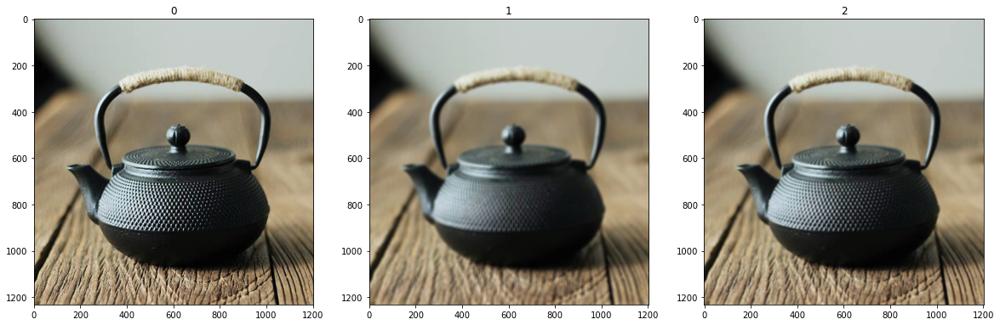

In [37]:
image_color_blur_01 = cv2.blur(image_color, (15, 15))
image_color_blur_02 = cv2.GaussianBlur(image_color, (15, 15), 0)

ShowListImages([image_color, image_color_blur_01, image_color_blur_02], 1, 3)

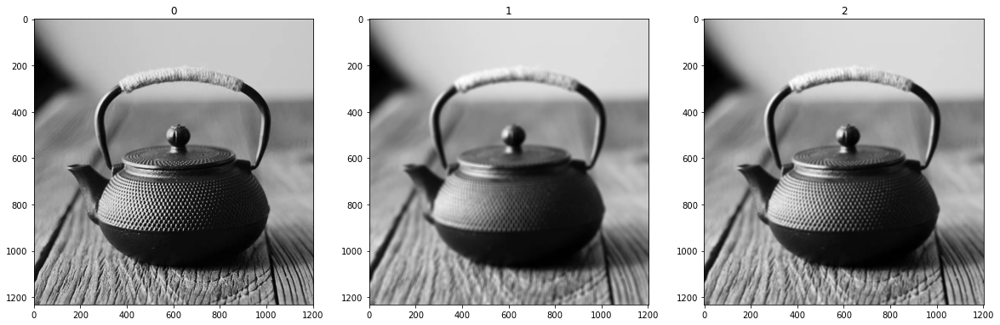

In [38]:
image_gray_blur_01 = cv2.blur(image_gray, (15, 15))
image_gray_blur_02 = cv2.GaussianBlur(image_gray, (15, 15), 0)

ShowListImages([image_gray, image_gray_blur_01, image_gray_blur_02], 1, 3)

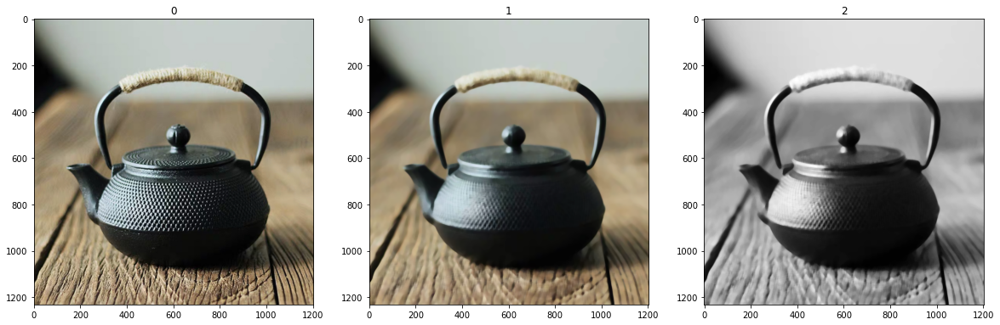

In [39]:
image_color_blur_03 = cv2.medianBlur(image_color, 15)
image_gray_blur_03 = cv2.medianBlur(image_gray, 15)

ShowListImages([image_color, image_color_blur_03, image_gray_blur_03], 1, 3)

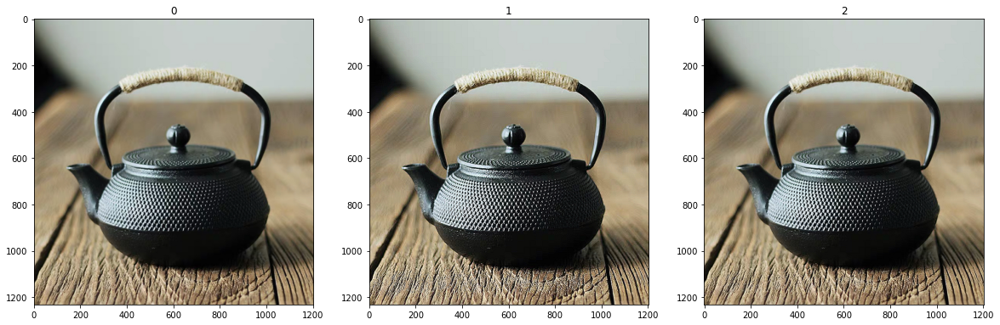

In [40]:
image_color_sharpen_01 = cv2.filter2D(image_color, -1, kernel_sharpen_01)
image_color_sharpen_02 = cv2.filter2D(image_color, -1, kernel_sharpen_02)

ShowListImages([image_color, image_color_sharpen_01, image_color_sharpen_02], 1, 3)

In [41]:
kernel_sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype = 'int')

kernel_sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype = 'int')

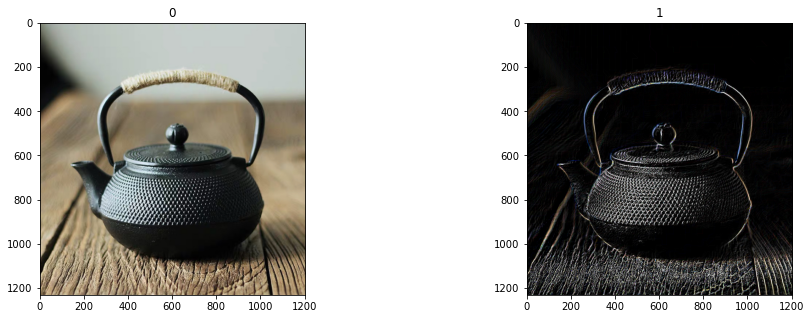

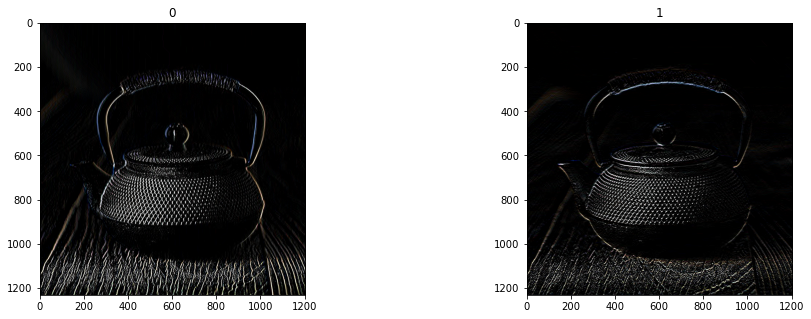

In [42]:
image_color_edge_sobelX = cv2.filter2D(image_color, -1, kernel_sobelX)
image_color_edge_sobelY = cv2.filter2D(image_color, -1, kernel_sobelY)
image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY

ShowListImages([image_color, image_color_edge], 1, 2)
ShowListImages([image_color_edge_sobelX, image_color_edge_sobelY], 1, 2)

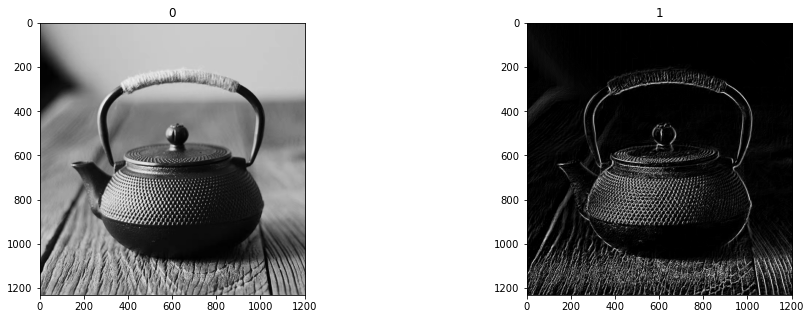

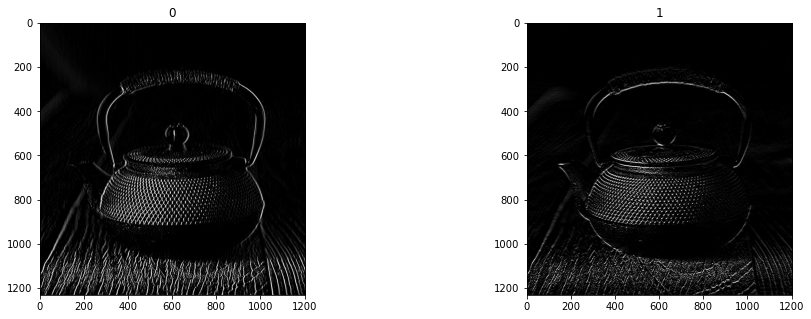

In [43]:
image_gray_edge_sobelX = cv2.filter2D(image_gray, -1, kernel_sobelX)
image_gray_edge_sobelY = cv2.filter2D(image_gray, -1, kernel_sobelY)
image_gray_edge = image_gray_edge_sobelX + image_gray_edge_sobelY

ShowListImages([image_gray, image_gray_edge], 1, 2)
ShowListImages([image_gray_edge_sobelX, image_gray_edge_sobelY], 1, 2)